In [1]:
import cv2
import os

from pycocotools.coco import COCO

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from random import randrange
from collections import defaultdict

In [2]:
data_dir = ('../dataset')
annotation = ('../dataset/train.json')
category = ["General trash", "Paper", "Paper pack", "Metal", "Glass", "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]

In [3]:
coco = COCO(annotation_file=annotation)

total_annotation = list()
images = dict()
for image_id in coco.getImgIds():
    image_info = coco.loadImgs(image_id)[0]
    images[image_id] = list()

    # images.append([image_info['width'], image_info['height'], image_info['file_name']])
    file_name = image_info['file_name']
    annotation_id = coco.getAnnIds(imgIds=image_info['id'])
    annotation_info_list = coco.loadAnns(annotation_id)
    
    for annotation_info in annotation_info_list:
        x_min, y_min, w, h = annotation_info['bbox']
        x_min, y_min, w, h = float(x_min), float(y_min), float(w), float(h)
        images[image_id].append([file_name, annotation_info['category_id'], x_min, x_min+w, y_min, y_min+h])

loading annotations into memory...
Done (t=0.13s)
creating index...
index created!


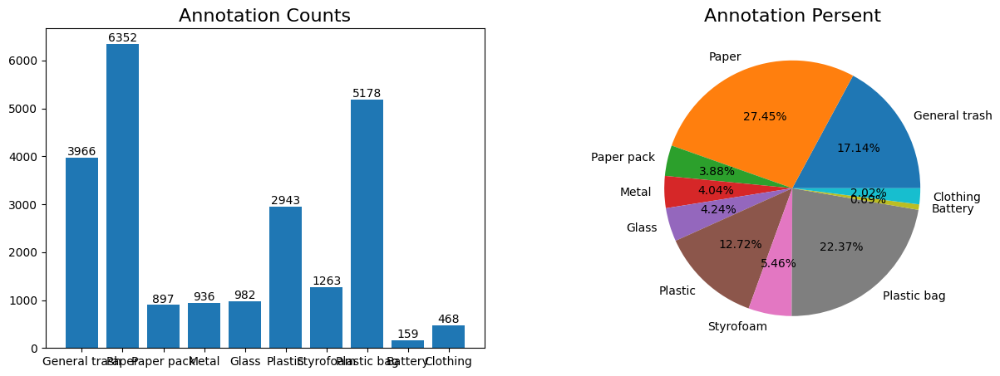

In [4]:
cnt = defaultdict(int)

for annotations in images.values():
    for annotation in annotations:
        cnt[annotation[1]] += 1

sorted_items = sorted(cnt.items(), key=lambda x : x[0])
key, value = zip(*sorted_items)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
bars = axes[0].bar(key, value, tick_label=category)
for bar, v in zip(bars, value):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height(), v, ha='center', va='bottom')
axes[0].set_title("Annotation Counts", fontsize=16)

axes[1].pie(value, labels=category, autopct="%.2f%%")
axes[1].set_title("Annotation Persent", fontsize=16)

plt.show()

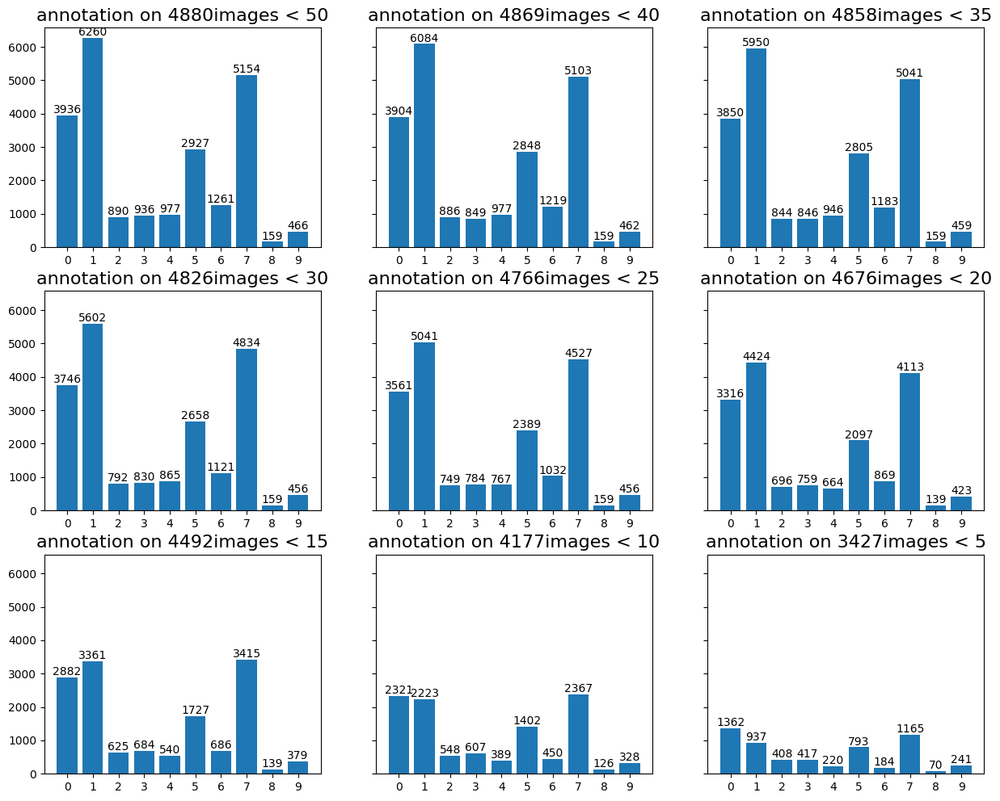

In [5]:
cnts = list()
image_cnts = list()
sizes = [50, 40, 35, 30, 25, 20, 15, 10, 5]
for i, c in enumerate(sizes):
    cnt = defaultdict(int)
    image_cnts.append(0)
    for annotations in images.values():
        if len(annotations) < c:
            image_cnts[i] += 1
            for annotation in annotations:
                cnt[annotation[1]] += 1
    cnts.append(cnt)

fig, axes = plt.subplots(3, 3, figsize=(15, 12), sharey=True)
for i, cnt in enumerate(cnts):
    x = i // 3
    y = i % 3
    sorted_items = sorted(cnt.items(), key=lambda x : x[0])
    key, value = zip(*sorted_items)

    bars = axes[x][y].bar(key, value, tick_label=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
    for bar, v in zip(bars, value):
        axes[x][y].text(bar.get_x() + bar.get_width() / 2, bar.get_height(), v, ha='center', va='bottom')
    axes[x][y].set_title(f"annotation on {image_cnts[i]}images < {sizes[i]}", fontsize=16)
plt.show()

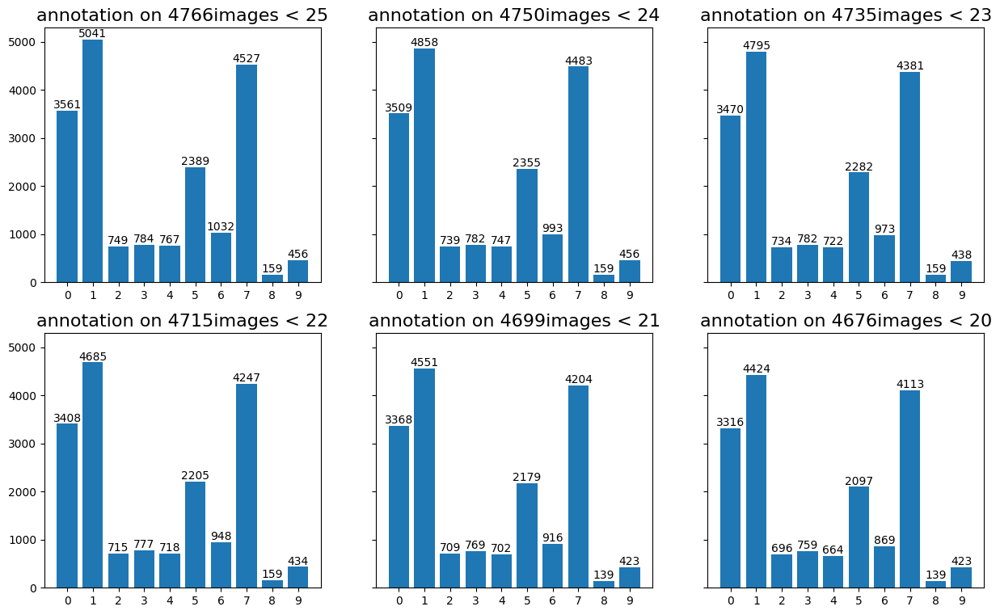

In [6]:
cnts = list()
image_cnts = list()
sizes = [25, 24, 23, 22, 21, 20]
for i, c in enumerate(sizes):
    cnt = defaultdict(int)
    image_cnts.append(0)
    for annotations in images.values():
        if len(annotations) < c:
            image_cnts[i] += 1
            for annotation in annotations:
                cnt[annotation[1]] += 1
    cnts.append(cnt)

fig, axes = plt.subplots(2, 3, figsize=(15, 9), sharey=True)
for i, cnt in enumerate(cnts):
    x = i // 3
    y = i % 3
    sorted_items = sorted(cnt.items(), key=lambda x : x[0])
    key, value = zip(*sorted_items)

    bars = axes[x][y].bar(key, value, tick_label=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
    for bar, v in zip(bars, value):
        axes[x][y].text(bar.get_x() + bar.get_width() / 2, bar.get_height(), v, ha='center', va='bottom')
    axes[x][y].set_title(f"annotation on {image_cnts[i]}images < {sizes[i]}", fontsize=16)
plt.show()

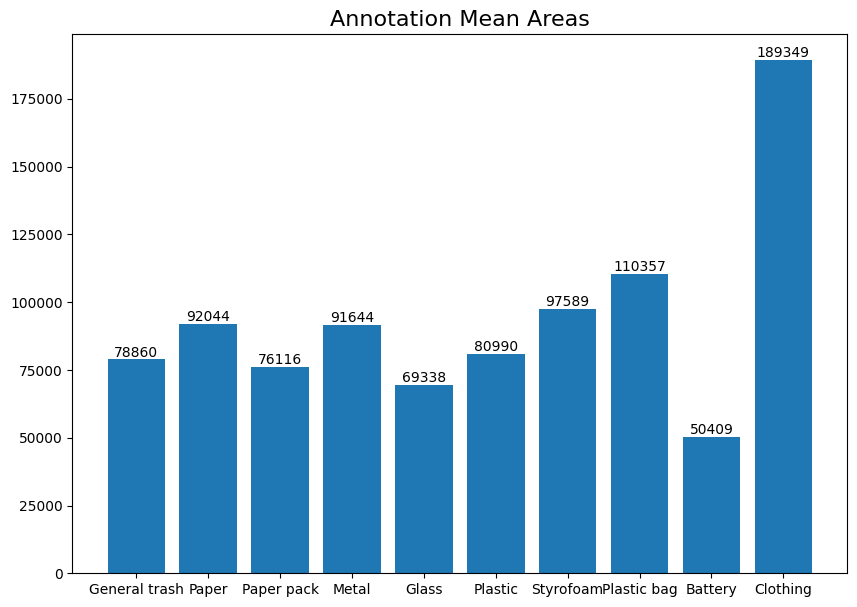

In [7]:
cnt = defaultdict(list)

for annotations in images.values():
    for annotation in annotations:
        cnt[annotation[1]].append((annotation[3] - annotation[2]) * (annotation[5] - annotation[4]))

sorted_items = sorted(cnt.items(), key=lambda x : x[0])
keys, areas = list(), list()
for key, area in sorted_items:
    keys.append(key)
    areas.append(sum(area) / len(area))

fig, ax = plt.subplots(figsize=(10, 7))
bars = ax.bar(keys, areas, tick_label=category)
for bar, area in zip(bars, areas):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), int(area), ha='center', va='bottom')
ax.set_title("Annotation Mean Areas", fontsize=16)
plt.show()

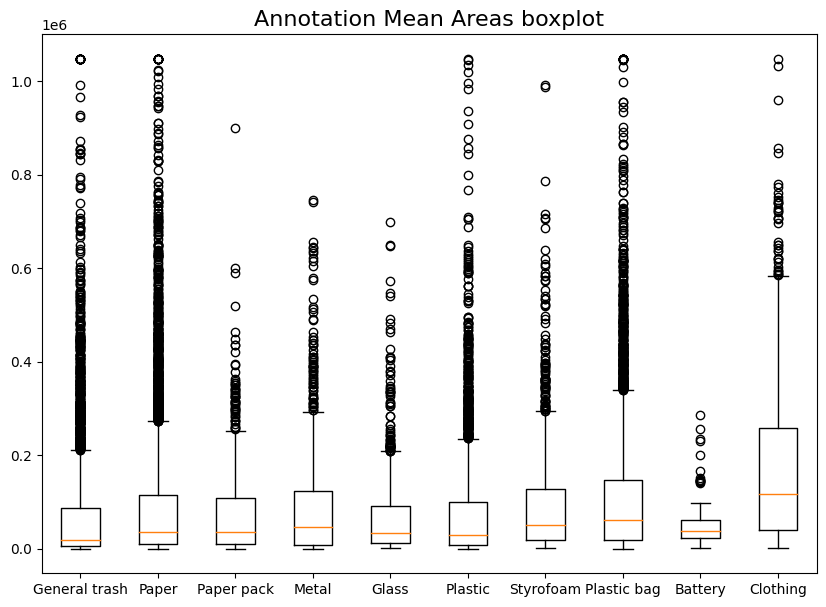

In [8]:
fig, ax = plt.subplots(figsize=(10, 7))

areas = list()
for _, a in sorted_items:
    areas.append(a)

ax.boxplot(areas, labels=category)
ax.set_title("Annotation Mean Areas boxplot", fontsize=16)
plt.show()

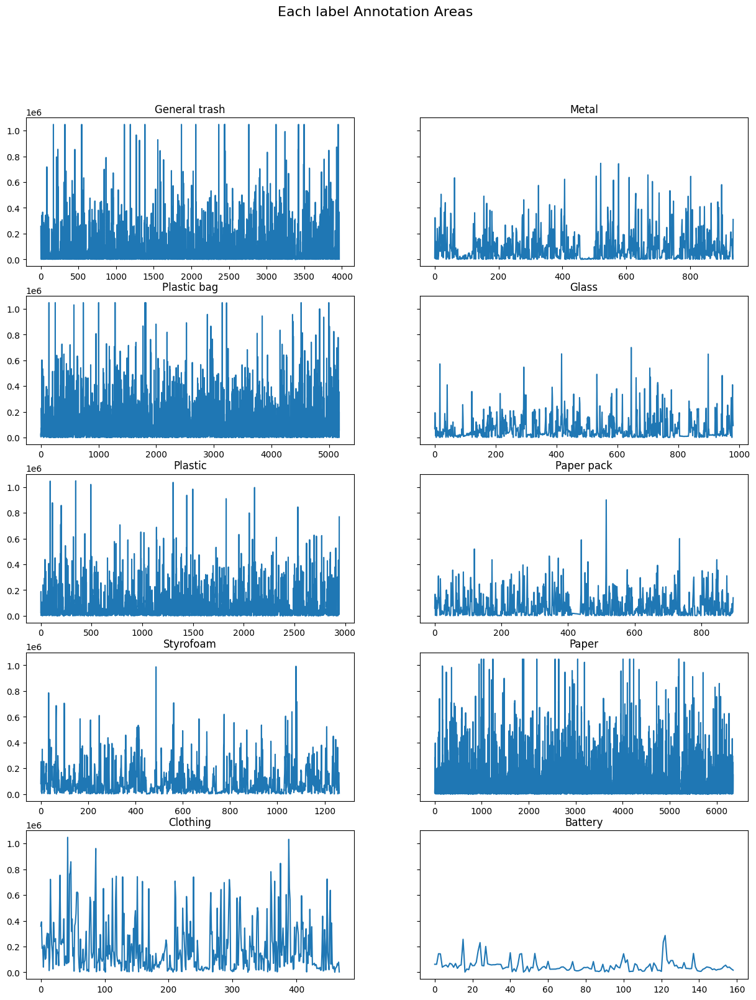

In [9]:
fig, axes = plt.subplots(5, 2, figsize=(15, 18), sharey=True)
for i, (key, value) in enumerate(cnt.items()):
    x = i // 2
    y = i % 2
    axes[x][y].plot(value)
    axes[x][y].set_title(category[key])
    
fig.suptitle("Each label Annotation Areas", fontsize=16)
fig.set_tight_layout
plt.show()

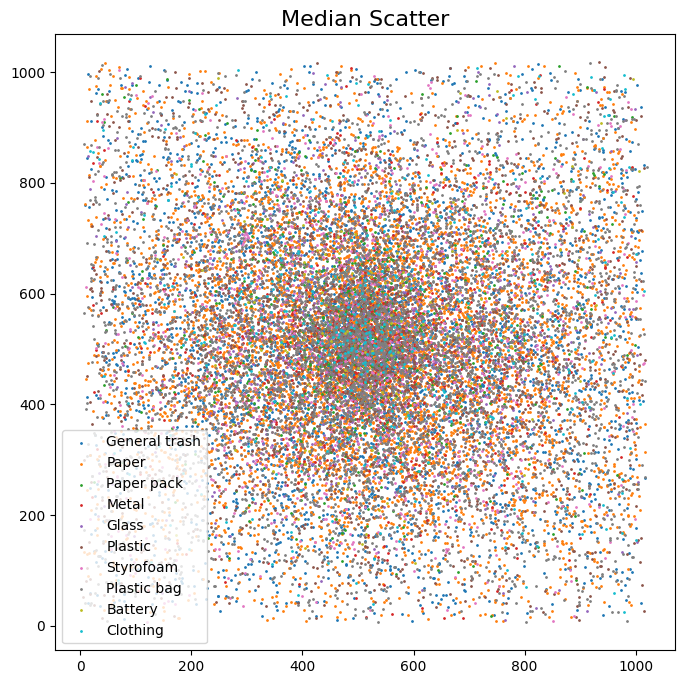

In [10]:
median_positions = {i:[[], []] for i in range(10)}

for annotations in images.values():
    for annotation in annotations:
        median_x = (annotation[2] + annotation[3]) * 0.5
        median_y = (annotation[4] + annotation[5]) * 0.5
        median_positions[annotation[1]][0].append(median_x)
        median_positions[annotation[1]][1].append(median_y)

fig, ax = plt.subplots(figsize=(8, 8))
for i in range(10):
    ax.scatter(x=median_positions[i][0], y=median_positions[i][1], s=1, label=category[i])
ax.set_title("Median Scatter", fontsize=16)
plt.legend()
plt.show()

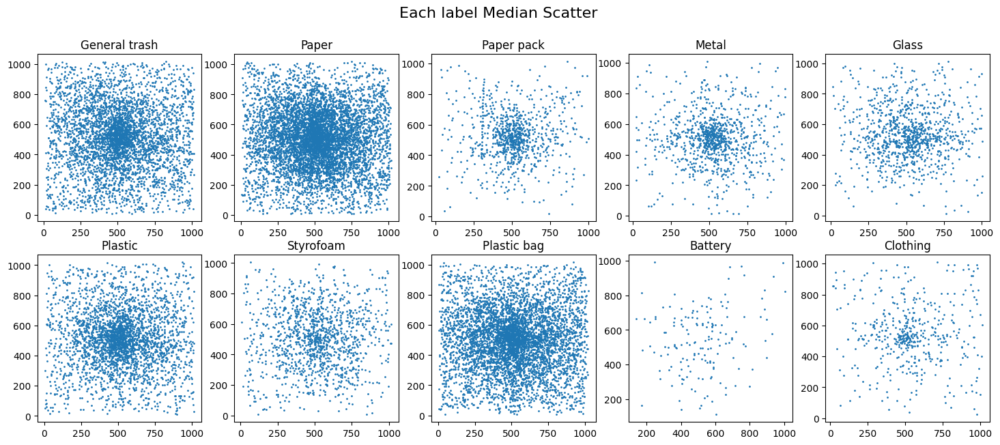

In [11]:
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
for i in range(10):
    x = i % 5
    y = i // 5
    axes[y][x].scatter(x=median_positions[i][0], y=median_positions[i][1], s=1)
    axes[y][x].set_title(category[i])
    
fig.suptitle("Each label Median Scatter", fontsize=16)
fig.set_tight_layout
plt.show()

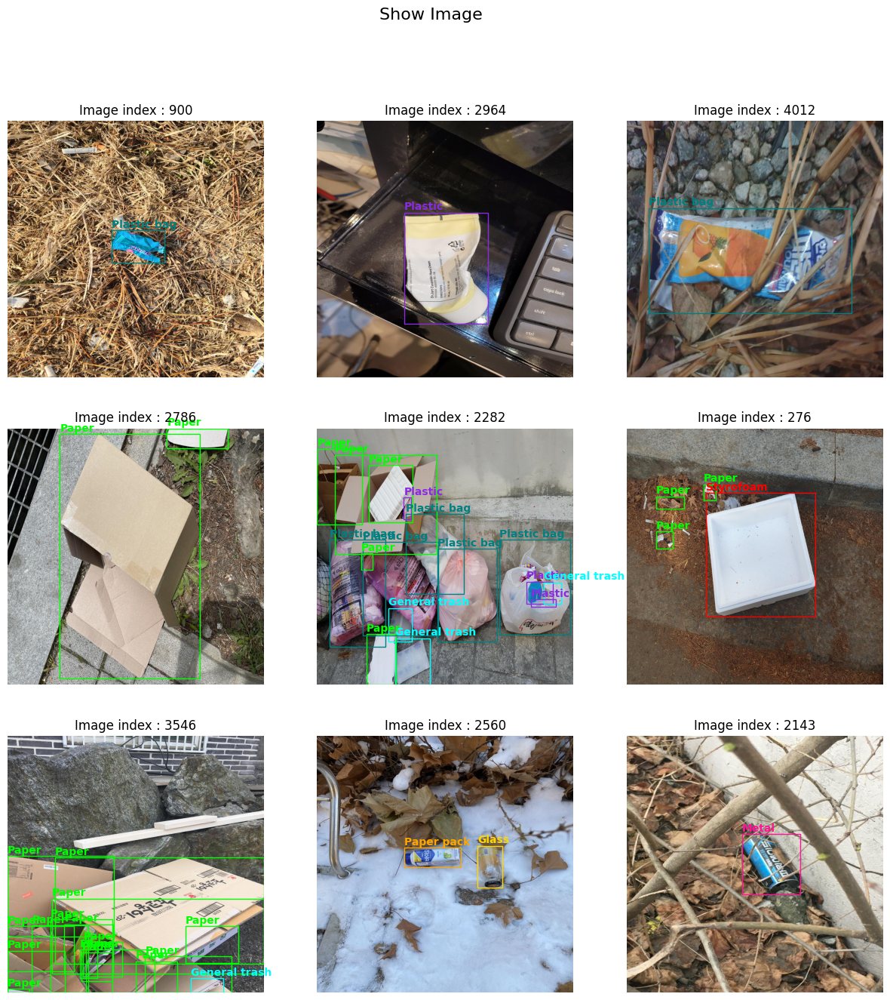

In [12]:
colors = ['cyan', 'lime', 'orange', 'deeppink', 'gold', 'blueviolet', 'red', 'teal', 'hotpink', 'mediumspringgreen']

fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for i, idx in enumerate([randrange(len(images)) for _ in range(9)]):
    x = i % 3
    y = i // 3
    img_path = os.path.join(data_dir, images[idx][0][0])
    img = Image.open(img_path)
    axes[x][y].imshow(img)
    axes[x][y].axis('off')
    for _, label, x_min, x_max, y_min, y_max in images[idx]:
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor=colors[label], facecolor='none')
        axes[x][y].add_patch(rect)
        axes[x][y].text(x_min, y_min-10, category[label], color=colors[label], fontsize=10, weight='bold')
        axes[x][y].set_title(f"Image index : {idx}")

fig.suptitle("Show Image", fontsize=16)
fig.set_tight_layout
plt.show()


1 : 40.55%
2 : 16.04%
3 : 8.29%
4 : 5.30%
5 : 4.46%
6 : 3.40%
7 : 3.22%
8 : 2.09%
9 : 2.19%
10 : 1.80%
11 : 1.37%
12 : 1.35%
13 : 0.98%
14 : 0.94%
15 : 0.92%
16 : 1.00%
17 : 0.82%
18 : 0.55%
19 : 0.47%
20 : 0.47%
21 : 0.33%
22 : 0.41%
23 : 0.31%
24 : 0.33%
25 : 0.29%
26 : 0.35%
27 : 0.23%
28 : 0.27%
29 : 0.10%
30 : 0.10%
31 : 0.18%
32 : 0.18%
33 : 0.06%
34 : 0.12%
35 : 0.06%
36 : 0.06%
37 : 0.06%
38 : 0.04%
39 : 0.06%
40 : 0.02%
41 : 0.04%
42 : 0.02%
43 : 0.06%
44 : 0.02%
45 : 0.02%
46 : 0.02%
47 : 0.02%


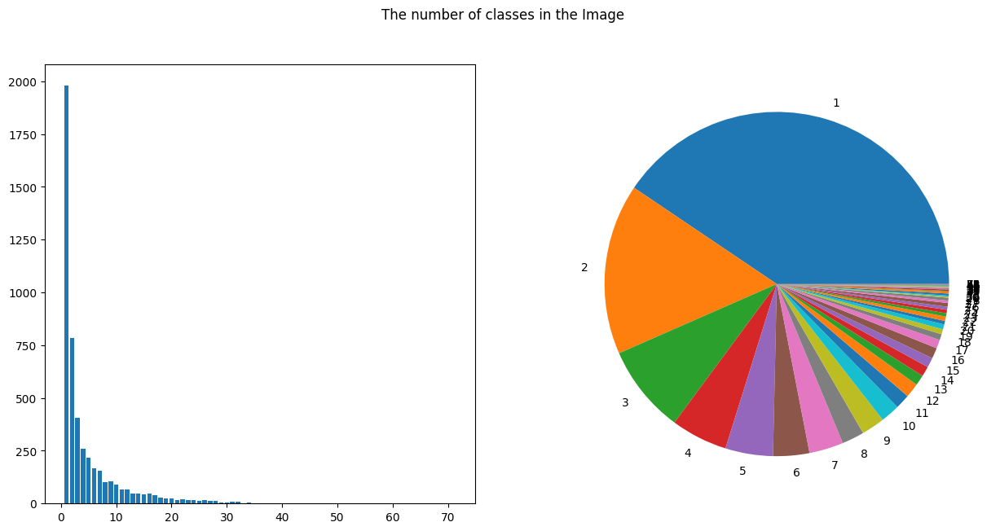

In [13]:
cnt = defaultdict(int)

for key, value in images.items():
    cnt[len(value)] += 1

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
key, value = zip(*sorted(cnt.items(), key=lambda x : x[0]))
for i, n in enumerate(value):
    print("{:0} : {:.2f}%".format(i+1, (n / len(images)) * 100))

axes[0].bar(key, value)
axes[1].pie(value, labels=key)
fig.suptitle("The number of classes in the Image")
fig.set_tight_layout
plt.show()

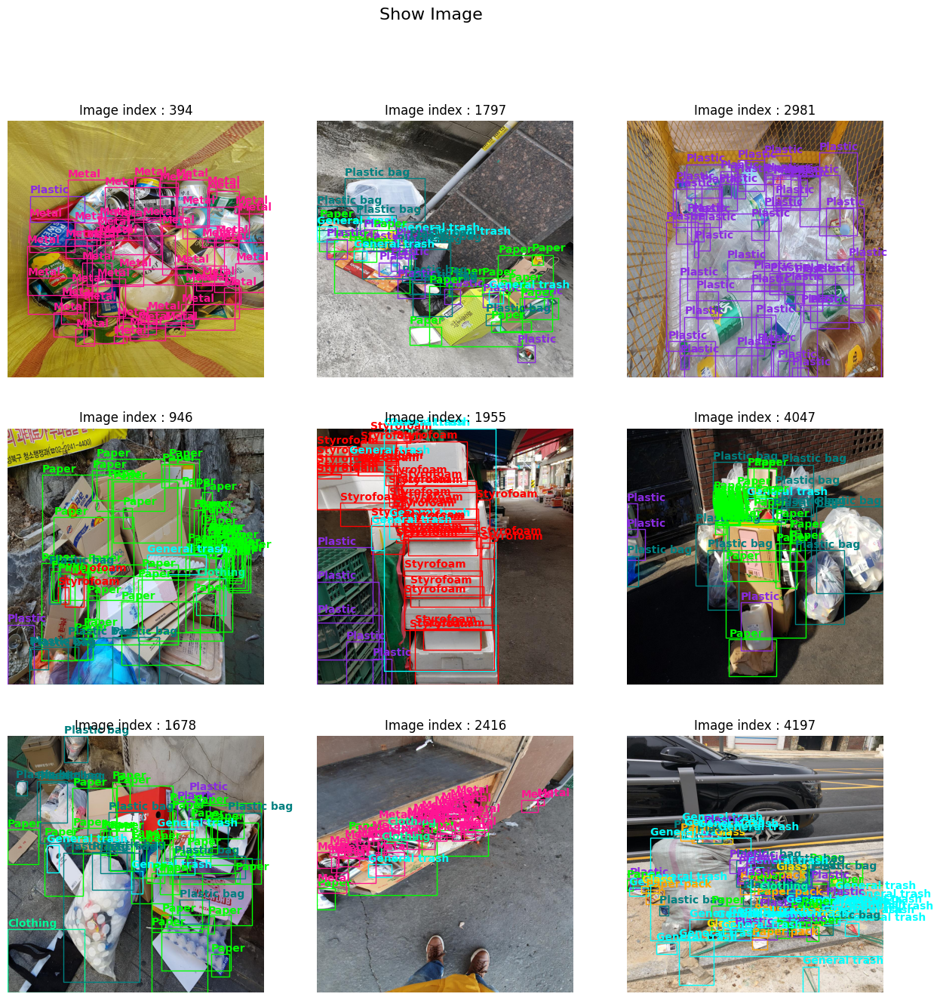

In [14]:
colors = ['cyan', 'lime', 'orange', 'deeppink', 'gold', 'blueviolet', 'red', 'teal', 'hotpink', 'mediumspringgreen']

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
cnt = 0
for i, annotations in images.items():
    if cnt == 9:
        break
    elif len(annotations) > 40:
        x = cnt % 3
        y = cnt // 3
        cnt += 1
        img_path = os.path.join(data_dir, annotations[0][0])
        img = Image.open(img_path)
        axes[x][y].imshow(img)
        axes[x][y].axis('off')
        for _, label, x_min, x_max, y_min, y_max in annotations:
            rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor=colors[label], facecolor='none')
            axes[x][y].add_patch(rect)
            axes[x][y].text(x_min, y_min-10, category[label], color=colors[label], fontsize=10, weight='bold')
            axes[x][y].set_title(f"Image index : {i}")

fig.suptitle("Show Image", fontsize=16)
fig.set_tight_layout
plt.show()


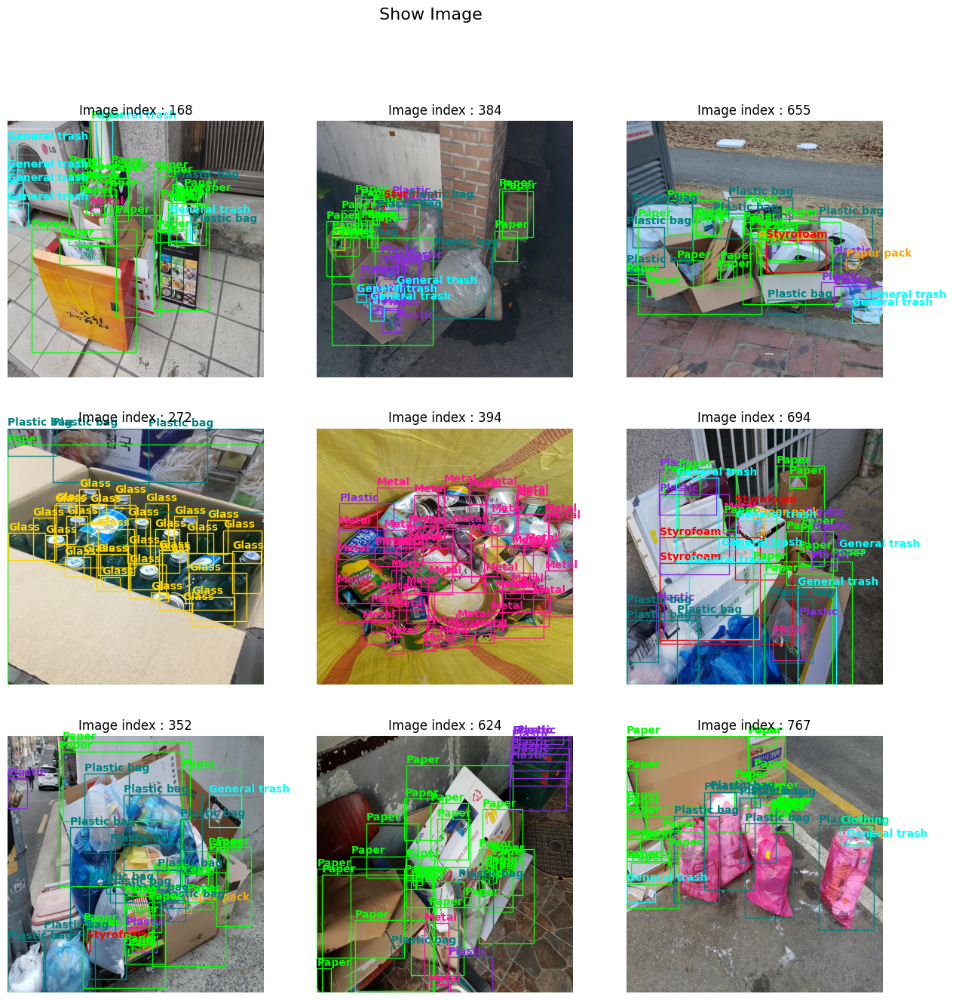

In [15]:
colors = ['cyan', 'lime', 'orange', 'deeppink', 'gold', 'blueviolet', 'red', 'teal', 'hotpink', 'mediumspringgreen']

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
cnt = 0
for i, annotations in images.items():
    if cnt == 9:
        break
    elif len(annotations) > 30:
        x = cnt % 3
        y = cnt // 3
        cnt += 1
        img_path = os.path.join(data_dir, annotations[0][0])
        img = Image.open(img_path)
        axes[x][y].imshow(img)
        axes[x][y].axis('off')
        for _, label, x_min, x_max, y_min, y_max in annotations:
            rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor=colors[label], facecolor='none')
            axes[x][y].add_patch(rect)
            axes[x][y].text(x_min, y_min-10, category[label], color=colors[label], fontsize=10, weight='bold')
            axes[x][y].set_title(f"Image index : {i}")

fig.suptitle("Show Image", fontsize=16)
fig.set_tight_layout
plt.show()


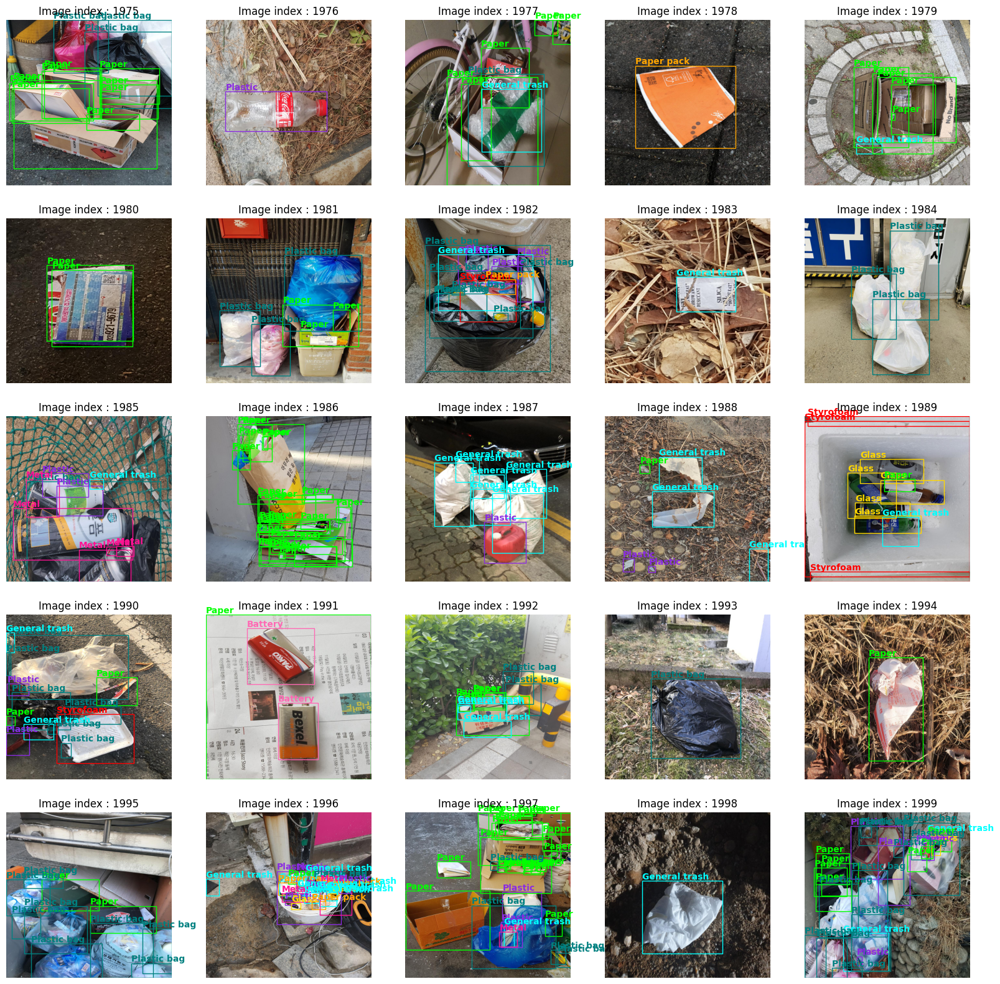

In [16]:
colors = ['cyan', 'lime', 'orange', 'deeppink', 'gold', 'blueviolet', 'red', 'teal', 'hotpink', 'mediumspringgreen']

num = 1000 + 25 * 39

fig, axes = plt.subplots(5, 5, figsize=(20, 20))
for i in range(num, num + 25):
    annotations = images[i]
    tmp = i - num
    x = tmp // 5
    y = tmp % 5
    cnt += 1
    img_path = os.path.join(data_dir, annotations[0][0])
    img = Image.open(img_path)
    axes[x][y].imshow(img)
    axes[x][y].axis('off')
    for _, label, x_min, x_max, y_min, y_max in annotations:
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor=colors[label], facecolor='none')
        axes[x][y].add_patch(rect)
        axes[x][y].text(x_min, y_min-10, category[label], color=colors[label], fontsize=10, weight='bold')
        axes[x][y].set_title(f"Image index : {i}")

fig.set_tight_layout
plt.show()

In [21]:
train_annotation = ('../dataset/split_train.json')
val_annotation = ('../dataset/split_val.json')
train_images, val_images = dict(), dict()

In [22]:
coco = COCO(annotation_file=train_annotation)

for image_id in coco.getImgIds():
    image_info = coco.loadImgs(image_id)[0]
    train_images[image_id] = list()

    # images.append([image_info['width'], image_info['height'], image_info['file_name']])
    file_name = image_info['file_name']
    annotation_id = coco.getAnnIds(imgIds=image_info['id'])
    annotation_info_list = coco.loadAnns(annotation_id)
    
    for annotation_info in annotation_info_list:
        x_min, y_min, w, h = annotation_info['bbox']
        x_min, y_min, w, h = float(x_min), float(y_min), float(w), float(h)
        train_images[image_id].append([file_name, annotation_info['category_id'], x_min, x_min+w, y_min, y_min+h])

loading annotations into memory...
Done (t=0.18s)
creating index...
index created!


In [23]:
coco = COCO(annotation_file=val_annotation)

for image_id in coco.getImgIds():
    image_info = coco.loadImgs(image_id)[0]
    val_images[image_id] = list()

    # images.append([image_info['width'], image_info['height'], image_info['file_name']])
    file_name = image_info['file_name']
    annotation_id = coco.getAnnIds(imgIds=image_info['id'])
    annotation_info_list = coco.loadAnns(annotation_id)
    
    for annotation_info in annotation_info_list:
        x_min, y_min, w, h = annotation_info['bbox']
        x_min, y_min, w, h = float(x_min), float(y_min), float(w), float(h)
        val_images[image_id].append([file_name, annotation_info['category_id'], x_min, x_min+w, y_min, y_min+h])

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [24]:
print(len(train_images), len(val_images))

4504 379


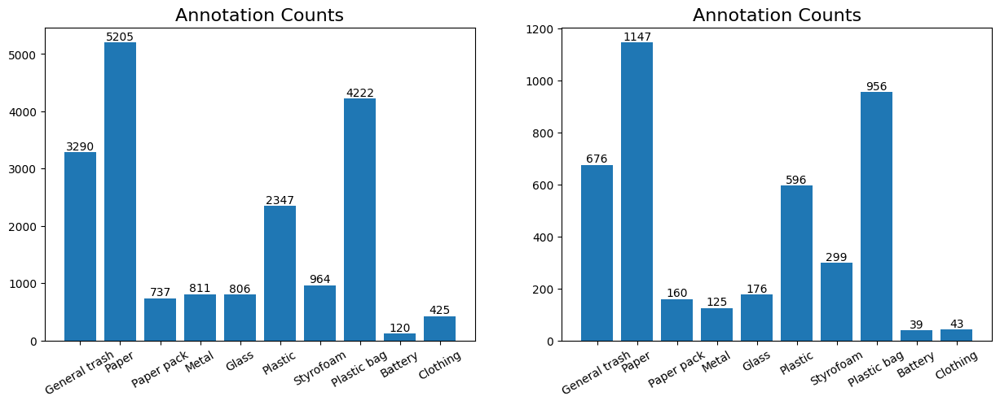

In [39]:
t_cnt, v_cnt= defaultdict(int), defaultdict(int)

for annotations in train_images.values():
    for annotation in annotations:
        t_cnt[annotation[1]] += 1
for annotations in val_images.values():
    for annotation in annotations:
        v_cnt[annotation[1]] += 1

sorted_items = sorted(t_cnt.items(), key=lambda x : x[0])
key, value = zip(*sorted_items)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
bars = axes[0].bar(key, value, tick_label=category)
for bar, v in zip(bars, value):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height(), v, ha='center', va='bottom')
axes[0].set_title("Annotation Counts", fontsize=16)
axes[0].tick_params(axis='x', labelrotation=30)

sorted_items = sorted(v_cnt.items(), key=lambda x : x[0])
key, value = zip(*sorted_items)

bars = axes[1].bar(key, value, tick_label=category)
for bar, v in zip(bars, value):
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height(), v, ha='center', va='bottom')
axes[1].set_title("Annotation Counts", fontsize=16)
axes[1].tick_params(axis='x', labelrotation=30)

plt.show()